In [0]:
import tensorflow as tf
import math
import numpy as np
import random
import librosa
import sklearn
import matplotlib.pyplot as plt
import librosa.display

In [0]:
test_1 = 'test_x_01.wav'
output_1 = 'output_1_1.wav'

test_2 = 'test_x_02.wav'
output_2 = 'output_2_1.wav'

save_path = "speech_denoising.ckpt/"

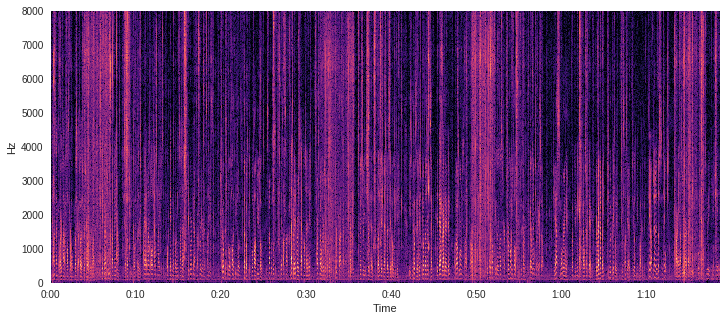

In [3]:
s, sr = librosa.load('train_clean_male.wav', sr=None)
S = librosa.stft(s, n_fft=1024, hop_length=512)
sn, sr = librosa.load('train_dirty_male.wav', sr=None)
X = librosa.stft(sn, n_fft=1024, hop_length=512)

S = np.abs(S)
S1 = S.T
X = np.abs(X)
X1 = X.T

Xdb = librosa.amplitude_to_db(X1.T)
plt.figure(figsize=(12, 5))
librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')

In [0]:
x = tf.placeholder("float", [None,513])
y = tf.placeholder("float", [None,513])

x_input = tf.reshape(x,[-1,513,1])
keep_prob_ = tf.placeholder(tf.float32, name = 'keep')


In [5]:

# Convolution layer 1
conv_layer_1 = tf.layers.conv1d(inputs=x_input, filters=16, kernel_size=2, activation = tf.nn.relu)
max_pool_1 = tf.layers.max_pooling1d(inputs=conv_layer_1, pool_size=2, strides=2)

# Convolution layer 2
conv_layer_2 = tf.layers.conv1d(inputs=max_pool_1, filters=32, kernel_size=2, activation = tf.nn.relu)
max_pool_2 = tf.layers.max_pooling1d(inputs=conv_layer_2, pool_size=2, strides=2)

conv_layer_3 = tf.layers.conv1d(inputs=max_pool_2, filters=64, kernel_size=2, activation = tf.nn.relu)
max_pool_3 = tf.layers.max_pooling1d(inputs=conv_layer_3, pool_size=2, strides=2)

flat_1 = tf.contrib.layers.flatten(max_pool_3)
flat_1 = tf.layers.dense(flat_1, 1024)
flat_1 = tf.layers.dropout(flat_1, rate=0.3)
#flat_1 = tf.nn.dropout(flat_1, keep_prob= 0.8)

# flat_2 = tf.layers.dense(flat_1, 1000, activation = tf.nn.relu)

output_layer = tf.layers.dense(flat_1, 513)

Instructions for updating:
Use keras.layers.conv1d instead.
Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Use keras.layers.max_pooling1d instead.

For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
If you depend on functionality not listed there, please file an issue.

Instructions for updating:
Use keras.layers.flatten instead.
Instructions for updating:
Use keras.layers.dense instead.
Instructions for updating:
Use keras.layers.dropout instead.


In [6]:
loss=tf.losses.mean_squared_error(labels=y,predictions=output_layer)

step = tf.Variable(0, trainable=False)
rate = tf.train.exponential_decay(0.01, step, 1, 0.9999)

train = tf.train.AdamOptimizer(learning_rate=0.0002).minimize(loss)

sess = tf.InteractiveSession()
sess.run(tf.global_variables_initializer())

Instructions for updating:
Use tf.cast instead.


In [0]:
def train_model():
  s, sr = librosa.load('train_clean_male.wav', sr=None)
  S = librosa.stft(s, n_fft=1024, hop_length=512)
  sn, sr = librosa.load('train_dirty_male.wav', sr=None)
  X = librosa.stft(sn, n_fft=1024, hop_length=512)

  S = np.abs(S)
  S1 = S.T
  X = np.abs(X)
  X1 = X.T
  print(np.shape(X1))
  saver=tf.train.Saver()
  n_input = 2459
  batch_size = 120
  for i in range(5000):
    for j in range((int)(n_input/batch_size)-1):

      batch_x, batch_y = X1.T[:, (j*batch_size):(j+1)*batch_size], S1.T[:, (j*batch_size):(j+1)*batch_size ]
      train.run(feed_dict={x: batch_x.T,y: batch_y.T})
    if i % 100 == 0:    
      print("Epoch: ",i)
      print("Loss: ",loss.eval(feed_dict={x: batch_x.T, y: batch_y.T}))


In [8]:
train_model()

(2459, 513)
Epoch:  0
Loss:  0.035125356
Epoch:  100
Loss:  0.003046468
Epoch:  200
Loss:  0.001656321
Epoch:  300
Loss:  0.0012054173
Epoch:  400
Loss:  0.0009883471
Epoch:  500
Loss:  0.0007662293
Epoch:  600
Loss:  0.0006822468
Epoch:  700
Loss:  0.00063041766
Epoch:  800
Loss:  0.00051994884
Epoch:  900
Loss:  0.00048318377
Epoch:  1000
Loss:  0.000524156
Epoch:  1100
Loss:  0.00047796202
Epoch:  1200
Loss:  0.00039299089
Epoch:  1300
Loss:  0.00036699872
Epoch:  1400
Loss:  0.000346905
Epoch:  1500
Loss:  0.0003222476
Epoch:  1600
Loss:  0.0003389402
Epoch:  1700
Loss:  0.0003236622
Epoch:  1800
Loss:  0.0002990456
Epoch:  1900
Loss:  0.00029403676
Epoch:  2000
Loss:  0.00028321054
Epoch:  2100
Loss:  0.0002594096
Epoch:  2200
Loss:  0.00024328296
Epoch:  2300
Loss:  0.00023684521
Epoch:  2400
Loss:  0.00024145715
Epoch:  2500
Loss:  0.00028170392
Epoch:  2600
Loss:  0.00028050263
Epoch:  2700
Loss:  0.00028792283
Epoch:  2800
Loss:  0.0002471412
Epoch:  2900
Loss:  0.0002747639
E

In [9]:
def test_model(test_file, output_file):
    print("Testing :", test_file)
    sn, sr = librosa.load(test_file, sr=None)
    X_test = librosa.stft(sn, n_fft=1024, hop_length=512)
    T_test = X_test
    batch_x = np.transpose(np.abs(X_test))
    with sess.as_default():
      output = output_layer.eval(feed_dict={x:batch_x})
    output_t = np.transpose(output)
    
    final_answer = np.multiply(np.divide(T_test, np.abs(T_test)), output_t)
    final_answer = librosa.istft(final_answer, win_length=1024, hop_length=512)
    print(final_answer.shape)
    librosa.output.write_wav(output_file, final_answer, sr)
    
test_model(test_1,output_1)
test_model(test_2,output_2)
test_model('train_dirty_male.wav','sample.wav')
#sess.close()

Testing : test_x_01.wav
(72192,)
Testing : test_x_02.wav
(194048,)
Testing : train_dirty_male.wav
(1258496,)


In [10]:
import IPython.display as ipd
ipd.Audio('./train_dirty_male.wav')

In [11]:
import IPython.display as ipd
ipd.Audio('./sample.wav')

In [12]:
import IPython.display as ipd
ipd.Audio('./test_x_01.wav')

In [13]:
ipd.Audio('./output_1_1.wav')

In [14]:
ipd.Audio('./test_x_02.wav')

In [15]:
ipd.Audio('./output_2_1.wav')

In [16]:
x_train1,sr = librosa.load('train_dirty_male.wav',sr=None)
# print(np.shape(x_train1))
X_train1 = librosa.stft(x_train1, n_fft=1024, hop_length=512)
# print(np.shape(s))
        
x_train1_abs = np.abs(X_train1)
# print(np.shape(x_train1_abs))

batch_x = x_train1_abs.T
predictions = output_layer.eval(feed_dict={x:batch_x})

fact = X_train1.T/x_train1_abs.T
# print(np.shape(S))
# print(np.shape(x_train1_abs))

# print(np.shape(fact))
s_train1 = np.multiply(fact,predictions)
# print(np.shape(s_train1))
# print(s_train1)

sh_train1  = librosa.istft(s_train1.T , win_length = 1024 , hop_length=512)
# print(np.shape(sh_train1))

sh_train = s[0:1258496]
# print(np.shape(sh_train))

num = np.sum(sh_train ** 2)
den = np.sum((sh_train - sh_train1) ** 2)
SNR = 10 * np.log10(num/den)
print("SNR = ", SNR)
sess.close()

SNR =  17.276310920715332
